# EE 451: Communications Systems
## Lesson 1 - Course Introduction & Complex Signal Review

### Learning Objectives
By the end of this lesson, you will be able to:
- Apply complex number operations using Euler's formula
- Represent sinusoidal signals using amplitude, frequency, and phase
- Visualize complex exponentials as rotating phasors
- Perform complex arithmetic in rectangular and polar forms
- Set up Python/Jupyter environment for signal processing

### Textbook Reference
Haykin & Moher, Chapter 1, Chapter 2.1

In [1]:
# Setup: Import required libraries
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from scipy.fft import fft, fftfreq
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')

# Matplotlib settings for publication-quality plots
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['font.size'] = 12
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.3

print("Setup complete! NumPy version:", np.__version__)
print("Matplotlib backend:", plt.get_backend())

Setup complete! NumPy version: 2.4.1
Matplotlib backend: module://matplotlib_inline.backend_inline


## 1. Complex Numbers: Rectangular and Polar Forms

Complex numbers are fundamental to communications engineering. A complex number $z$ can be represented in two forms:

**Rectangular Form:**
$$z = a + jb$$
where $a$ is the real part and $b$ is the imaginary part.

**Polar Form:**
$$z = r \angle \theta = r e^{j\theta}$$
where $r = |z| = \sqrt{a^2 + b^2}$ is the magnitude and $\theta = \arg(z) = \arctan(b/a)$ is the phase.

**Conversions:**
- Rectangular to Polar: $r = \sqrt{a^2 + b^2}$, $\theta = \arctan(b/a)$
- Polar to Rectangular: $a = r\cos(\theta)$, $b = r\sin(\theta)$

In [2]:
# Example: Complex number conversions
# Convert 3 + j4 to polar form

a = 3  # Real part
b = 4  # Imaginary part

# Calculate magnitude and phase
r = np.sqrt(a**2 + b**2)
theta_rad = np.arctan2(b, a)  # Use arctan2 for correct quadrant
theta_deg = np.degrees(theta_rad)

print(f"Rectangular form: {a} + j{b}")
print(f"Polar form: {r:.4f} ∠ {theta_deg:.2f}°")
print(f"Phase in radians: {theta_rad:.4f} rad")

# Verify using Python's complex type
z = complex(a, b)
print(f"\nUsing Python complex: {z}")
print(f"Magnitude: {abs(z):.4f}")
print(f"Phase: {np.angle(z, deg=True):.2f}°")

Rectangular form: 3 + j4
Polar form: 5.0000 ∠ 53.13°
Phase in radians: 0.9273 rad

Using Python complex: (3+4j)
Magnitude: 5.0000
Phase: 53.13°


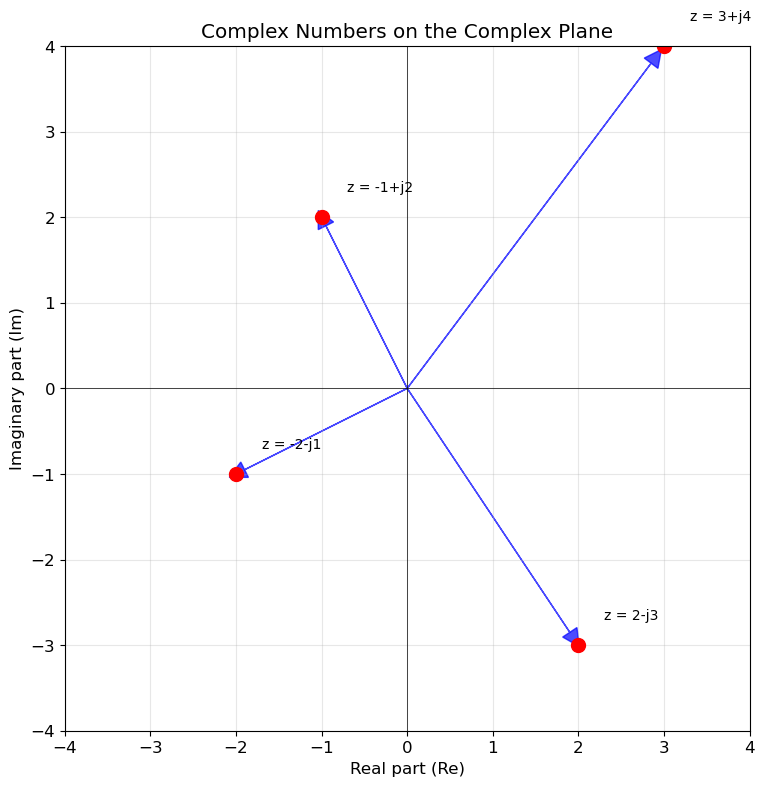

In [3]:
# Visualize complex numbers on the complex plane
fig, ax = plt.subplots(figsize=(8, 8))

# Example complex numbers
complex_numbers = [
    (3, 4, 'z = 3+j4'),
    (-1, 2, 'z = -1+j2'),
    (2, -3, 'z = 2-j3'),
    (-2, -1, 'z = -2-j1')
]

for a, b, label in complex_numbers:
    # Plot point
    ax.plot(a, b, 'ro', markersize=10)
    # Plot vector from origin
    ax.arrow(0, 0, a*0.95, b*0.95, head_width=0.2, head_length=0.2, 
             fc='blue', ec='blue', alpha=0.7)
    # Add label
    ax.text(a+0.3, b+0.3, label, fontsize=10)

# Set equal aspect ratio and grid
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.set_aspect('equal')
ax.axhline(y=0, color='k', linewidth=0.5)
ax.axvline(x=0, color='k', linewidth=0.5)
ax.grid(True, alpha=0.3)
ax.set_xlabel('Real part (Re)')
ax.set_ylabel('Imaginary part (Im)')
ax.set_title('Complex Numbers on the Complex Plane')
plt.tight_layout()
plt.show()

## 2. Euler's Formula: The Foundation

**Euler's formula** is arguably the most beautiful equation in mathematics:

$$e^{j\theta} = \cos(\theta) + j\sin(\theta)$$

This elegant relationship connects:
- Complex exponentials (left side)
- Trigonometric functions (right side)
- Geometry on the complex plane

**Special Case:** When $\theta = \pi$:
$$e^{j\pi} = \cos(\pi) + j\sin(\pi) = -1 + j(0) = -1$$

This gives us Euler's identity: $e^{j\pi} + 1 = 0$, connecting five fundamental constants!

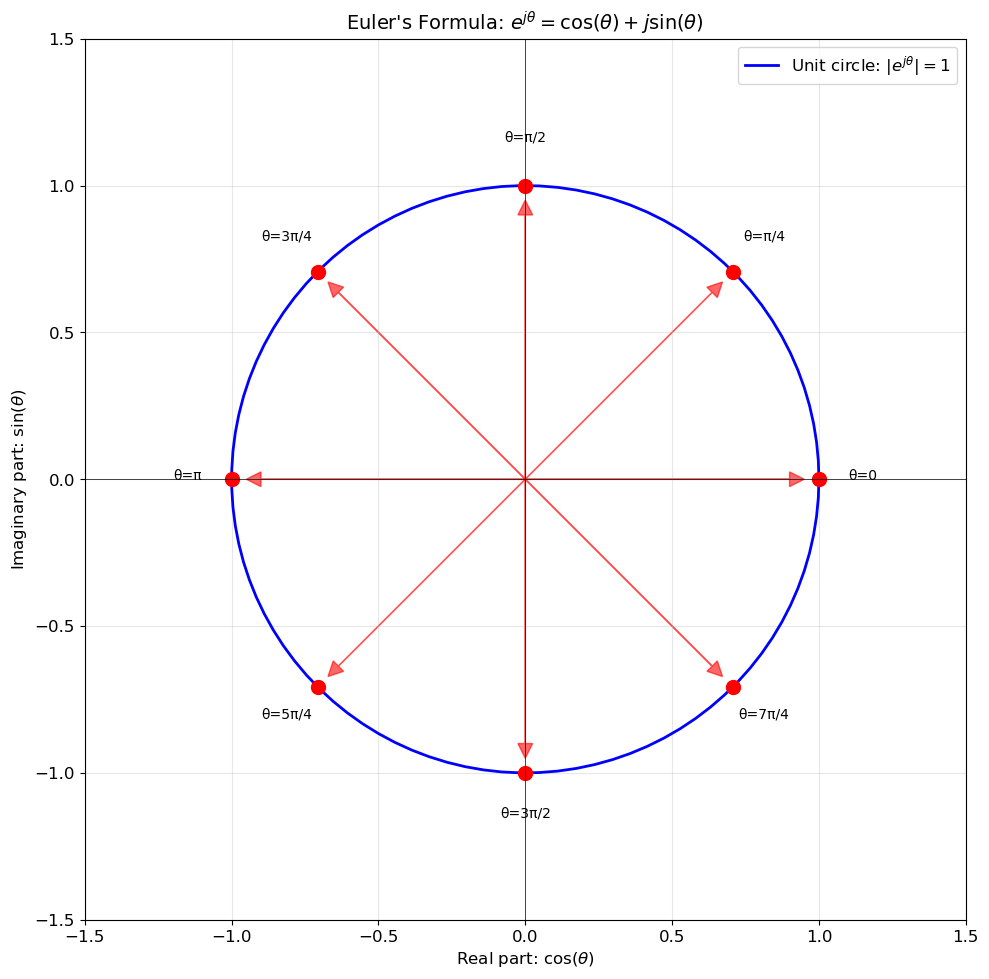


Numerical verification of Euler's formula:
θ = 0     : e^(jθ) = 1.0000+0.0000j, cos(θ)+jsin(θ) = 1.0000+0.0000j
θ = π/4   : e^(jθ) = 0.7071+0.7071j, cos(θ)+jsin(θ) = 0.7071+0.7071j
θ = π/2   : e^(jθ) = 0.0000+1.0000j, cos(θ)+jsin(θ) = 0.0000+1.0000j
θ = 3π/4  : e^(jθ) = -0.7071+0.7071j, cos(θ)+jsin(θ) = -0.7071+0.7071j


In [4]:
# Visualize Euler's formula on the unit circle
theta = np.linspace(0, 2*np.pi, 100)
x = np.cos(theta)
y = np.sin(theta)

fig, ax = plt.subplots(figsize=(10, 10))

# Draw unit circle
ax.plot(x, y, 'b-', linewidth=2, label='Unit circle: $|e^{j\\theta}| = 1$')

# Mark special angles
special_angles = {
    0: '0',
    np.pi/4: 'π/4',
    np.pi/2: 'π/2',
    3*np.pi/4: '3π/4',
    np.pi: 'π',
    5*np.pi/4: '5π/4',
    3*np.pi/2: '3π/2',
    7*np.pi/4: '7π/4'
}

for angle, label in special_angles.items():
    x_pos = np.cos(angle)
    y_pos = np.sin(angle)
    ax.plot(x_pos, y_pos, 'ro', markersize=10)
    ax.arrow(0, 0, x_pos*0.9, y_pos*0.9, head_width=0.05, head_length=0.05, 
             fc='red', ec='red', alpha=0.6)
    # Place label outside circle
    ax.text(x_pos*1.15, y_pos*1.15, f'θ={label}', fontsize=10, ha='center')

ax.set_xlim(-1.5, 1.5)
ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal')
ax.axhline(y=0, color='k', linewidth=0.5)
ax.axvline(x=0, color='k', linewidth=0.5)
ax.grid(True, alpha=0.3)
ax.set_xlabel('Real part: $\\cos(\\theta)$')
ax.set_ylabel('Imaginary part: $\\sin(\\theta)$')
ax.set_title('Euler\'s Formula: $e^{j\\theta} = \\cos(\\theta) + j\\sin(\\theta)$', fontsize=14)
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

# Verify Euler's formula numerically
print("\nNumerical verification of Euler's formula:")
for angle_val, angle_name in list(special_angles.items())[:4]:
    euler_form = np.exp(1j * angle_val)
    trig_form = np.cos(angle_val) + 1j * np.sin(angle_val)
    print(f"θ = {angle_name:6s}: e^(jθ) = {euler_form:8.4f}, "
          f"cos(θ)+jsin(θ) = {trig_form:8.4f}")

## 3. Complex Arithmetic

### Addition and Subtraction
Easiest in **rectangular form**:
$$(a_1 + jb_1) + (a_2 + jb_2) = (a_1 + a_2) + j(b_1 + b_2)$$

### Multiplication and Division
Easiest in **polar form**:
$$r_1 e^{j\theta_1} \cdot r_2 e^{j\theta_2} = r_1 r_2 e^{j(\theta_1 + \theta_2)}$$
$$\frac{r_1 e^{j\theta_1}}{r_2 e^{j\theta_2}} = \frac{r_1}{r_2} e^{j(\theta_1 - \theta_2)}$$

### Complex Conjugate
$$z^* = a - jb = r e^{-j\theta}$$

In [5]:
# Example: Multiply (2∠30°)(3∠45°)
r1 = 2
theta1_deg = 30
r2 = 3
theta2_deg = 45

# Convert to radians
theta1 = np.radians(theta1_deg)
theta2 = np.radians(theta2_deg)

# Method 1: Polar multiplication
r_result = r1 * r2
theta_result = theta1 + theta2
theta_result_deg = np.degrees(theta_result)

print("Multiplication in polar form:")
print(f"({r1}∠{theta1_deg}°) × ({r2}∠{theta2_deg}°) = {r_result}∠{theta_result_deg:.1f}°")

# Method 2: Using complex numbers
z1 = r1 * np.exp(1j * theta1)
z2 = r2 * np.exp(1j * theta2)
z_result = z1 * z2

print(f"\nUsing Python complex multiplication:")
print(f"Result: {abs(z_result):.4f}∠{np.angle(z_result, deg=True):.1f}°")
print(f"Rectangular form: {z_result.real:.4f} + j{z_result.imag:.4f}")

Multiplication in polar form:
(2∠30°) × (3∠45°) = 6∠75.0°

Using Python complex multiplication:
Result: 6.0000∠75.0°
Rectangular form: 1.5529 + j5.7956


z = (3+4j)
z* = (3-4j)

z × z* = 25.0000+0.0000j  (This should be real and equal to |z|²)
|z|² = 25.0000


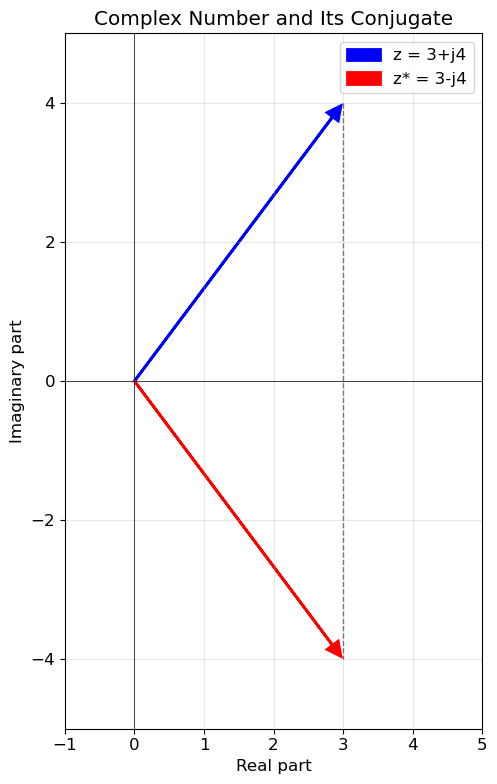

In [6]:
# Practice: Complex conjugate
z = 3 + 4j
z_conj = np.conj(z)

print(f"z = {z}")
print(f"z* = {z_conj}")
print(f"\nz × z* = {z * z_conj:.4f}  (This should be real and equal to |z|²)")
print(f"|z|² = {abs(z)**2:.4f}")

# Visualize complex conjugate
fig, ax = plt.subplots(figsize=(8, 8))

# Plot z and z*
ax.arrow(0, 0, z.real*0.95, z.imag*0.95, head_width=0.2, head_length=0.2, 
         fc='blue', ec='blue', linewidth=2, label='z = 3+j4')
ax.arrow(0, 0, z_conj.real*0.95, z_conj.imag*0.95, head_width=0.2, head_length=0.2, 
         fc='red', ec='red', linewidth=2, label='z* = 3-j4')

ax.plot([z.real, z_conj.real], [z.imag, z_conj.imag], 'k--', alpha=0.5, linewidth=1)

ax.set_xlim(-1, 5)
ax.set_ylim(-5, 5)
ax.set_aspect('equal')
ax.axhline(y=0, color='k', linewidth=0.5)
ax.axvline(x=0, color='k', linewidth=0.5)
ax.grid(True, alpha=0.3)
ax.set_xlabel('Real part')
ax.set_ylabel('Imaginary part')
ax.set_title('Complex Number and Its Conjugate')
ax.legend()
plt.tight_layout()
plt.show()

## 4. Sinusoidal Signals and Phasors

A general sinusoid is expressed as:
$$x(t) = A \cos(2\pi ft + \phi)$$

where:
- $A$ = amplitude (units: volts, amps, etc.)
- $f$ = frequency (Hz)
- $\omega = 2\pi f$ = angular frequency (rad/s)
- $\phi$ = phase (radians or degrees)

### Complex Exponential Representation
Using Euler's formula:
$$x(t) = \text{Re}\{A e^{j\phi} e^{j2\pi ft}\} = \text{Re}\{\tilde{X} e^{j2\pi ft}\}$$

where $\tilde{X} = A e^{j\phi}$ is the **phasor** representation (time-independent complex number).

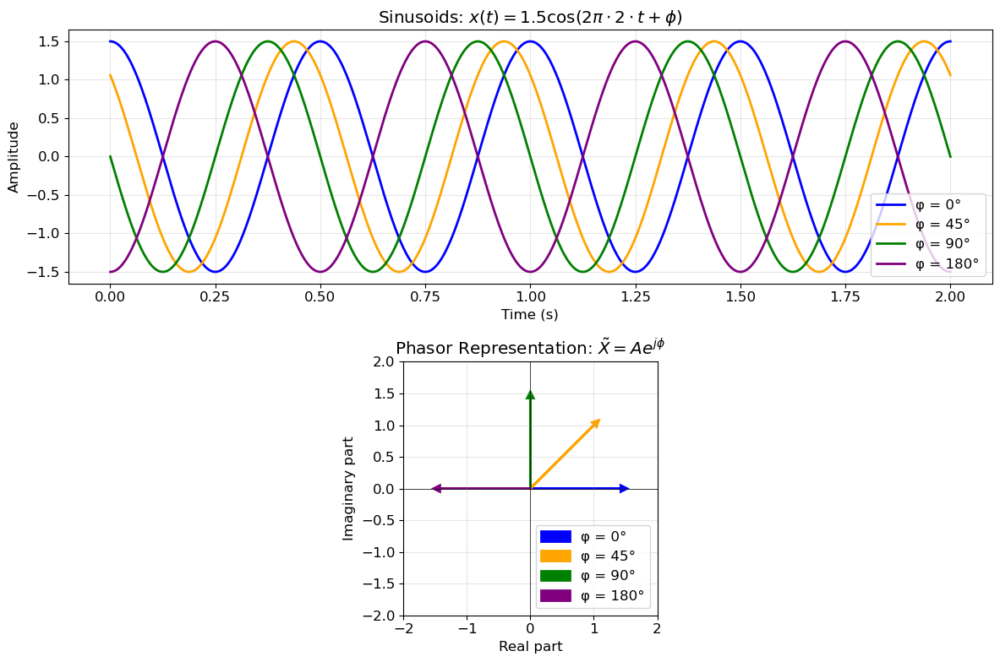

In [7]:
# Example: Plot sinusoid with different phases
t = np.linspace(0, 2, 1000)  # 2 seconds
A = 1.5  # Amplitude
f = 2    # Frequency in Hz

# Different phase values
phases       = [0, np.pi/4, np.pi/2, np.pi]
phase_labels = ['0°', '45°', '90°', '180°']
colors       = ['blue','orange', 'green', 'purple']

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# Plot time-domain signals
for phi, label, color in zip(phases, phase_labels, colors):
    x = A * np.cos(2*np.pi*f*t + phi)
    ax1.plot(t, x, linewidth=2, label=f'φ = {label}', color=color)

ax1.set_xlabel('Time (s)')
ax1.set_ylabel('Amplitude')
ax1.set_title(f'Sinusoids: $x(t) = {A} \\cos(2\\pi \\cdot {f} \\cdot t + \\phi)$')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot phasors on complex plane
for phi, label,color in zip(phases, phase_labels,colors):
    phasor = A * np.exp(1j * phi)
    ax2.arrow(0, 0, phasor.real*0.95, phasor.imag*0.95, 
              head_width=0.1, head_length=0.1, linewidth=2, label=f'φ = {label}',color=color)

ax2.set_xlim(-2, 2)
ax2.set_ylim(-2, 2)
ax2.set_aspect('equal')
ax2.axhline(y=0, color='k', linewidth=0.5)
ax2.axvline(x=0, color='k', linewidth=0.5)
ax2.grid(True, alpha=0.3)
ax2.set_xlabel('Real part')
ax2.set_ylabel('Imaginary part')
ax2.set_title('Phasor Representation: $\\tilde{X} = A e^{j\\phi}$')
ax2.legend(loc='lower right')

plt.tight_layout()
plt.show()

## 5. Rotating Complex Exponential (Animation)

The complex exponential $e^{j2\pi ft}$ represents a phasor rotating on the unit circle at frequency $f$ Hz.

In [8]:
# Create rotating phasor animation
f = 1  # 1 Hz rotation
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Time vector
t_anim = np.linspace(0, 2, 200)  # 2 seconds, 200 frames
omega = 2 * np.pi * f

# Setup complex plane plot (left)
ax1.set_xlim(-1.5, 1.5)
ax1.set_ylim(-1.5, 1.5)
ax1.set_aspect('equal')
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.axvline(x=0, color='k', linewidth=0.5)
ax1.grid(True, alpha=0.3)
ax1.set_xlabel('Real part')
ax1.set_ylabel('Imaginary part')
ax1.set_title('Rotating Phasor: $e^{j2\\pi ft}$')

# Draw unit circle
circle_theta = np.linspace(0, 2*np.pi, 100)
ax1.plot(np.cos(circle_theta), np.sin(circle_theta), 'b--', alpha=0.3)

# Phasor arrow (will be updated)
phasor_arrow = ax1.arrow(0, 0, 1, 0, head_width=0.1, head_length=0.1, 
                         fc='red', ec='red', linewidth=2)
time_text = ax1.text(0.02, 0.95, '', transform=ax1.transAxes, fontsize=12)

# Setup time-domain plot (right)
ax2.set_xlim(0, 2)
ax2.set_ylim(-1.5, 1.5)
ax2.grid(True, alpha=0.3)
ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Amplitude')
ax2.set_title('Real Part: $\\cos(2\\pi ft)$')

# Plot full cosine wave
ax2.plot(t_anim, np.cos(omega * t_anim), 'b-', alpha=0.3, linewidth=1)
line, = ax2.plot([], [], 'r-', linewidth=2)
point, = ax2.plot([], [], 'ro', markersize=8)

def animate(frame):
    t_now = t_anim[frame]
    
    # Update phasor
    phasor = np.exp(1j * omega * t_now)
    ax1.clear()
    ax1.set_xlim(-1.5, 1.5)
    ax1.set_ylim(-1.5, 1.5)
    ax1.set_aspect('equal')
    ax1.axhline(y=0, color='k', linewidth=0.5)
    ax1.axvline(x=0, color='k', linewidth=0.5)
    ax1.grid(True, alpha=0.3)
    ax1.set_xlabel('Real part')
    ax1.set_ylabel('Imaginary part')
    ax1.set_title('Rotating Phasor: $e^{j2\\pi ft}$')
    ax1.plot(np.cos(circle_theta), np.sin(circle_theta), 'b--', alpha=0.3)
    ax1.arrow(0, 0, phasor.real*0.95, phasor.imag*0.95, 
              head_width=0.1, head_length=0.1, fc='red', ec='red', linewidth=2)
    ax1.text(0.02, 0.95, f't = {t_now:.2f} s', transform=ax1.transAxes, fontsize=12)
    
    # Update time-domain plot
    line.set_data(t_anim[:frame+1], np.cos(omega * t_anim[:frame+1]))
    point.set_data([t_now], [np.cos(omega * t_now)])
    
    return line, point

# Create animation
anim = FuncAnimation(fig, animate, frames=len(t_anim), interval=50, blit=False, repeat=True)

plt.tight_layout()
plt.close()  # Prevent static display

# Display animation
HTML(anim.to_jshtml())

## 6. Phasor Addition

Adding sinusoids at the same frequency:
$$x_1(t) = A_1 \cos(\omega t + \phi_1), \quad x_2(t) = A_2 \cos(\omega t + \phi_2)$$

Phasor method:
$$\tilde{X} = \tilde{X}_1 + \tilde{X}_2 = A_1 e^{j\phi_1} + A_2 e^{j\phi_2}$$

Then:
$$x(t) = x_1(t) + x_2(t) = \text{Re}\{\tilde{X} e^{j\omega t}\}$$

Phasor 1: 1∠0° = (1+0j)
Phasor 2: 1∠90° = (6.123233995736766e-17+1j)
Sum: 1.4142∠45.0° = (1+1j)

Result: 1.4142 cos(ωt + 45.0°)


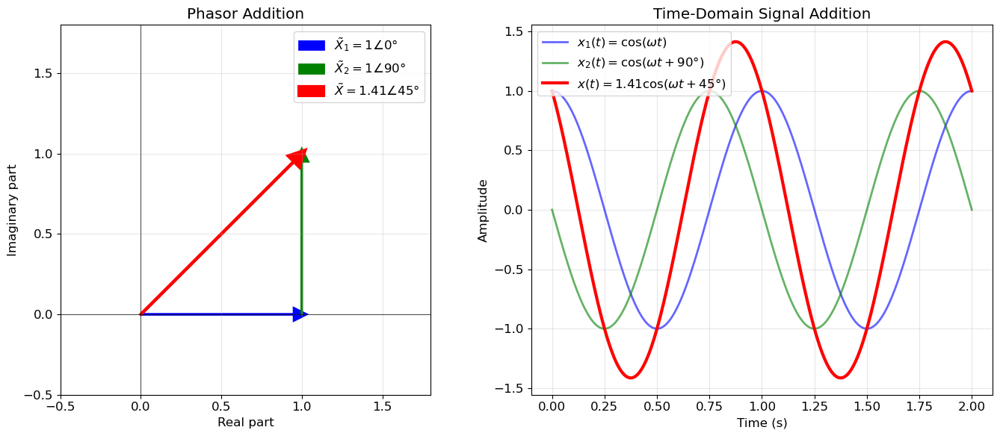

In [9]:
# Example: Add cos(ωt) + cos(ωt + 90°)
A1 = 1
phi1 = 0
A2 = 1
phi2 = np.pi/2  # 90 degrees

# Phasor addition
phasor1 = A1 * np.exp(1j * phi1)
phasor2 = A2 * np.exp(1j * phi2)
phasor_sum = phasor1 + phasor2

A_result = abs(phasor_sum)
phi_result = np.angle(phasor_sum)

print(f"Phasor 1: {A1}∠{np.degrees(phi1):.0f}° = {phasor1}")
print(f"Phasor 2: {A2}∠{np.degrees(phi2):.0f}° = {phasor2}")
print(f"Sum: {A_result:.4f}∠{np.degrees(phi_result):.1f}° = {phasor_sum}")
print(f"\nResult: {A_result:.4f} cos(ωt + {np.degrees(phi_result):.1f}°)")

# Visualize phasor addition
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

# Phasor diagram
ax1.arrow(0, 0, phasor1.real*0.95, phasor1.imag*0.95, 
          head_width=0.08, head_length=0.08, fc='blue', ec='blue', 
          linewidth=2, label='$\\tilde{X}_1 = 1∠0°$')
ax1.arrow(phasor1.real, phasor1.imag, phasor2.real*0.95, phasor2.imag*0.95, 
          head_width=0.08, head_length=0.08, fc='green', ec='green', 
          linewidth=2, label='$\\tilde{X}_2 = 1∠90°$')
ax1.arrow(0, 0, phasor_sum.real*0.95, phasor_sum.imag*0.95, 
          head_width=0.1, head_length=0.1, fc='red', ec='red', 
          linewidth=3, label=f'$\\tilde{{X}} = {A_result:.2f}∠{np.degrees(phi_result):.0f}°$')

ax1.set_xlim(-0.5, 1.8)
ax1.set_ylim(-0.5, 1.8)
ax1.set_aspect('equal')
ax1.axhline(y=0, color='k', linewidth=0.5)
ax1.axvline(x=0, color='k', linewidth=0.5)
ax1.grid(True, alpha=0.3)
ax1.set_xlabel('Real part')
ax1.set_ylabel('Imaginary part')
ax1.set_title('Phasor Addition')
ax1.legend()

# Time-domain signals
t = np.linspace(0, 2, 1000)
omega = 2 * np.pi * 1  # 1 Hz
x1 = A1 * np.cos(omega*t + phi1)
x2 = A2 * np.cos(omega*t + phi2)
x_sum = A_result * np.cos(omega*t + phi_result)

ax2.plot(t, x1, 'b-', linewidth=2, alpha=0.6, label='$x_1(t) = \\cos(\\omega t)$')
ax2.plot(t, x2, 'g-', linewidth=2, alpha=0.6, label='$x_2(t) = \\cos(\\omega t + 90°)$')
ax2.plot(t, x_sum, 'r-', linewidth=3, label=f'$x(t) = {A_result:.2f}\\cos(\\omega t + {np.degrees(phi_result):.0f}°)$')

ax2.set_xlabel('Time (s)')
ax2.set_ylabel('Amplitude')
ax2.set_title('Time-Domain Signal Addition')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 7. Practice Problems

Try these exercises to reinforce your understanding:

1. **Convert to polar form:** $z = -1 + j\sqrt{3}$
2. **Multiply:** $(1 + j)(2 - j3)$
3. **Express using complex notation:** $5\cos(2\pi \cdot 1000t - \pi/4)$
4. **Add phasors:** $2\angle30° + 3\angle60°$

In [10]:
# Solution space for practice problems
# Try solving these on your own first!

# Problem 1: Convert -1 + j√3 to polar
z1 = -1 + 1j*np.sqrt(3)
print("Problem 1:")
print(f"z = {z1}")
print(f"Magnitude: {abs(z1):.4f}")
print(f"Phase: {np.angle(z1, deg=True):.2f}°")
print(f"Polar form: {abs(z1):.4f}∠{np.angle(z1, deg=True):.2f}°")

# Problem 2: Multiply (1+j)(2-j3)
z2a = 1 + 1j
z2b = 2 - 3j
z2_result = z2a * z2b
print(f"\nProblem 2:")
print(f"(1+j)(2-j3) = {z2_result}")

# Problem 3: Express 5cos(2π·1000t - π/4) using complex notation
A3 = 5
f3 = 1000
phi3 = -np.pi/4
phasor3 = A3 * np.exp(1j * phi3)
print(f"\nProblem 3:")
print(f"5cos(2π·1000t - π/4) = Re{{5e^(-jπ/4) e^(j2π·1000t)}}")
print(f"Phasor: {abs(phasor3):.4f}∠{np.angle(phasor3, deg=True):.2f}°")

# Problem 4: Add 2∠30° + 3∠60°
p4a = 2 * np.exp(1j * np.radians(30))
p4b = 3 * np.exp(1j * np.radians(60))
p4_sum = p4a + p4b
print(f"\nProblem 4:")
print(f"2∠30° + 3∠60° = {abs(p4_sum):.4f}∠{np.angle(p4_sum, deg=True):.2f}°")

Problem 1:
z = (-1+1.7320508075688772j)
Magnitude: 2.0000
Phase: 120.00°
Polar form: 2.0000∠120.00°

Problem 2:
(1+j)(2-j3) = (5-1j)

Problem 3:
5cos(2π·1000t - π/4) = Re{5e^(-jπ/4) e^(j2π·1000t)}
Phasor: 5.0000∠-45.00°

Problem 4:
2∠30° + 3∠60° = 4.8366∠48.07°


## Key Concepts Summary

1. **Complex numbers** have rectangular form $(a+jb)$ and polar form $(r\angle\theta)$
2. **Euler's formula** $e^{j\theta} = \cos(\theta) + j\sin(\theta)$ is fundamental
3. **Phasors** $\tilde{X} = Ae^{j\phi}$ represent sinusoids as time-independent complex numbers
4. **Complex exponentials** $e^{j2\pi ft}$ rotate on the unit circle at frequency $f$
5. **Phasor addition** simplifies sinusoid arithmetic
6. Use **rectangular form** for addition/subtraction, **polar form** for multiplication/division

## Next Lesson Preview
Lesson 2 will cover:
- Signal operations: convolution, correlation
- Energy vs. power signals
- Analytic signals and Hilbert transform
- System characterization using impulse response